In [1]:
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from collections import Counter
from matplotlib_scalebar.scalebar import ScaleBar
import os

import cell2location
import scvi

DPI = 300
FONTSIZE = 20  # 42
sc.settings.set_figure_params(
    scanpy=True, dpi=100, transparent=True, vector_friendly=True, dpi_save=DPI
)
from matplotlib import rcParams

rcParams["pdf.fonttype"] = 42

import seaborn as sns
from pathlib import Path

custom_params = {"font.size": FONTSIZE, "figure.dpi": 100, "savefig.dpi": DPI}
sns.set_theme(style="ticks", rc=custom_params)

# QC utils functions - a package
from vistools import utils
from vistools import spatial_plots
from vistools import cell2loc_spatial_colours

Global seed set to 0


### to change sample name and dataset

In [2]:
SAMPLE_NAME = "CRC08_LM_VISIUM"

# DIR2SAVE
DIR2SAVE = Path(
    f"/data/BCI-CRC/nasrine/data/CRC/spatial/CRC_LM_VISIUM/CRC_LM_VISIUM_04_08_09_11/cell2location/{SAMPLE_NAME}"
)
DIR2SAVE.mkdir(parents=True, exist_ok=True)

In [3]:
run_name = DIR2SAVE.joinpath(f"cell2location_map-no_cycling_TME/")
run_name.mkdir(parents=True, exist_ok=True)

# figures
FIG2SAVE = run_name.joinpath("figures/final/")
FIG2SAVE.mkdir(parents=True, exist_ok=True)
# set the global variable: sc.settings.figdir to save all plots
sc.settings.figdir = FIG2SAVE

In [4]:
adata_file = f"{run_name}/sp.h5ad"
adata_vis = sc.read_h5ad(adata_file)
mod = cell2location.models.Cell2location.load(f"{run_name}", adata_vis)

INFO     File /data/BCI-CRC/nasrine/data/CRC/spatial/CRC_LM_VISIUM/CRC_LM_VISIUM_04_08_09_11/
         cell2location/CRC08_LM_VISIUM/cell2location_map-no_cycling_TME/model.pt already     
         downloaded                                                                          
INFO     Preparing underlying module for load                                                


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
/data/BCI-CRC/nasrine/anaconda/envs/cell2loc19/lib/python3.9/site-packages/pytorch_lightning/trainer/configuration_validator.py:120: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
/data/BCI-CRC/nasrine/anaconda/envs/cell2loc19/lib/python3.9/site-packages/pytorch_lightning/trainer/data_loading.py:432: UserWarning: The number of training samples (1) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  rank_zero_warn(


Epoch 1/30000:   0%|          | 1/30000 [00:01<10:06:13,  1.21s/it, v_num=1, elbo_train=2.33e+7]


### Visualising cell abundance in spatial coordinates

We use 5% quantile of the posterior distribution, representing the value of cell abundance that the model has high confidence in (aka ‘at least this amount is present’).

In [5]:
# add 5% quantile, representing confident cell abundance, 'at least this amount is present',
# to adata.obs with nice names for plotting
adata_vis.obs[adata_vis.uns["mod"]["factor_names"]] = adata_vis.obsm[
    "q05_cell_abundance_w_sf"
]
adata_vis.uns["mod"]["factor_names"]

array(['B', 'C1QC Mac', 'C3 iCAF', 'CD4 Tfh', 'CD4 Th', 'CD4 Th HSP',
       'CD4 Th17', 'CD4 Tn', 'CD8 Tem', 'CD8 Tem GZMB', 'CD8 Tem HSP',
       'CD8 Tex', 'Cholangiocyte', 'Colonocyte', 'ECM CAF',
       'Enteroendocrine', 'FCN1 Mono', 'Goblet', 'HSP Mono', 'Hepatocyte',
       'Hypoxia', 'IL1B Mac', 'Intermediate', 'Kupffer', 'Lymphatic endo',
       'MAIT', 'Mast', 'Myofibroblast', 'NK1', 'NK2', 'NKT', 'NLRP3 Mac',
       'Neutrophil', 'PLTP LYVE1 Mac', 'Pericyte', 'Plasma', 'SEC', 'SMC',
       'SPP1 Mac', 'Stalk-like endo', 'Stem', 'Stem (NOTUM high)', 'TA1',
       'TA2', 'Tip-like endo', 'Treg', 'Tuft', 'UPR', 'cDC1', 'cDC2',
       'gdT', 'ipEMT', 'migDC', 'pDC', 'pEMT'], dtype=object)

In [6]:
cell2plot = "Stem"

CRC08_LM_VISIUM


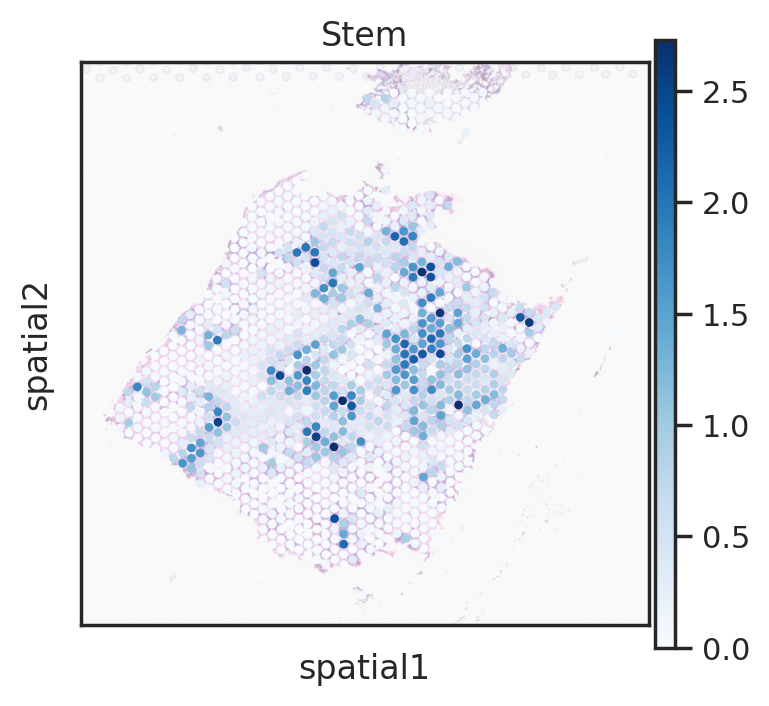

In [7]:
for visium_slide in set(adata_vis.obs["Sample"]):
    print(visium_slide)

    # select one slide
    slide = utils.select_slide(adata_vis, s=visium_slide, batch_key="Sample")
    
    # get size pixel
    lib_id = [x for x in slide.uns['spatial'].keys()][0]
    pix_size = spatial_plots.get_pixel_size_visium(slide, lib_id)

    # visualise cell locations
    # plot in spatial coordinates
    fig, ax = plt.subplots()
    with mpl.rc_context({"axes.facecolor": "black", "figure.figsize": [4.5, 5]}):

        sc.pl.spatial(
            slide,
            cmap="Blues", #plasma RdPu PuBu
            color=cell2plot,
            ncols=4,
            size=1.3,
            img_key="hires",
            alpha_img=0.5,
            # limit color scale at 99.2% quantile of cell abundance
            vmin=0,
            vmax="p99.7",
            #save=f"{visium_slide}_{cell2plot}_4HE.pdf",
            show=False,
            ax=ax
        )
    # add scale bar
    #scalebar = ScaleBar(pix_size, "um", length_fraction=0.25, frameon=False, location='lower right')
    #ax.add_artist(scalebar)
    
    fig.savefig(
            FIG2SAVE.joinpath(f"{visium_slide}_{cell2plot}.pdf"),
            dpi=DPI,
            format="pdf",
            facecolor="w",
            transparent=True,
            edgecolor="w",
            bbox_inches="tight"
        )  

In [8]:
FIG2SAVE

PosixPath('/data/BCI-CRC/nasrine/data/CRC/spatial/CRC_LM_VISIUM/CRC_LM_VISIUM_04_08_09_11/cell2location/CRC08_LM_VISIUM/cell2location_map-no_cycling_TME/figures/final')

CRC08_LM_VISIUM
CRC08_LM_VISIUM
CRC08_LM_VISIUM
CRC08_LM_VISIUM
CRC08_LM_VISIUM
CRC08_LM_VISIUM
CRC08_LM_VISIUM
CRC08_LM_VISIUM
CRC08_LM_VISIUM
CRC08_LM_VISIUM
CRC08_LM_VISIUM
CRC08_LM_VISIUM
CRC08_LM_VISIUM
CRC08_LM_VISIUM
CRC08_LM_VISIUM
CRC08_LM_VISIUM
CRC08_LM_VISIUM
CRC08_LM_VISIUM
CRC08_LM_VISIUM
CRC08_LM_VISIUM
CRC08_LM_VISIUM


/tmp/3678268.1.all.q/ipykernel_118743/725642626.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


CRC08_LM_VISIUM
CRC08_LM_VISIUM
CRC08_LM_VISIUM
CRC08_LM_VISIUM
CRC08_LM_VISIUM
CRC08_LM_VISIUM
CRC08_LM_VISIUM
CRC08_LM_VISIUM
CRC08_LM_VISIUM
CRC08_LM_VISIUM
CRC08_LM_VISIUM


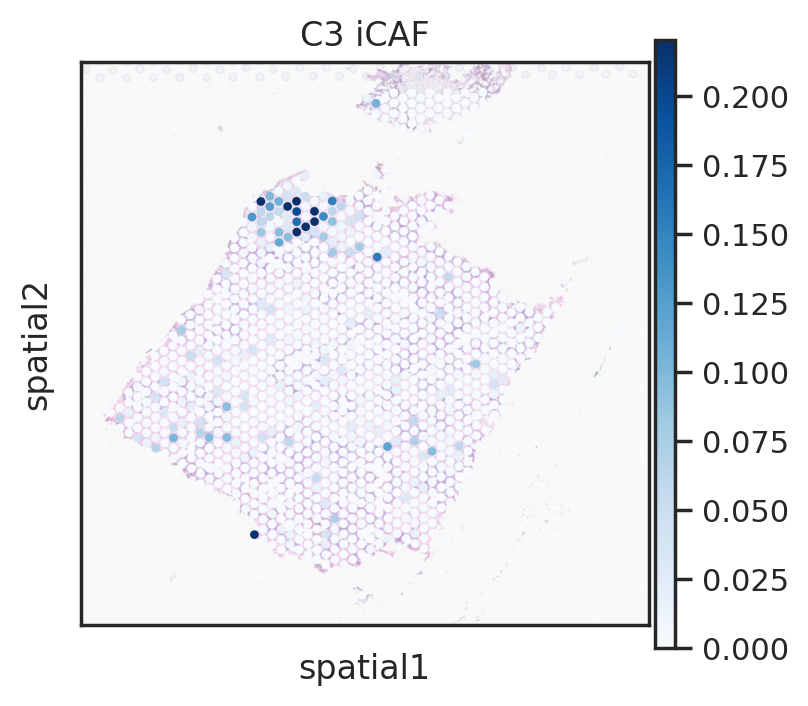

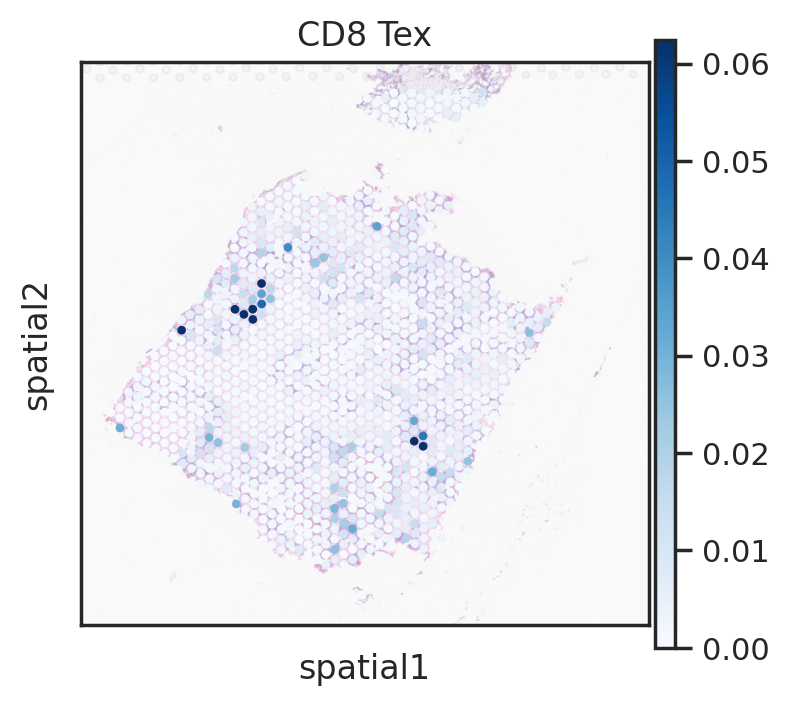

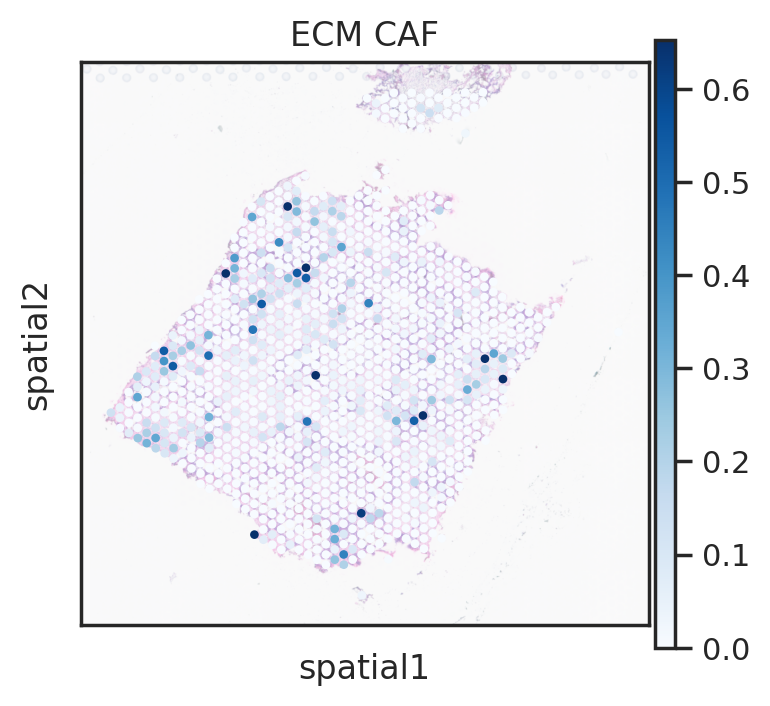

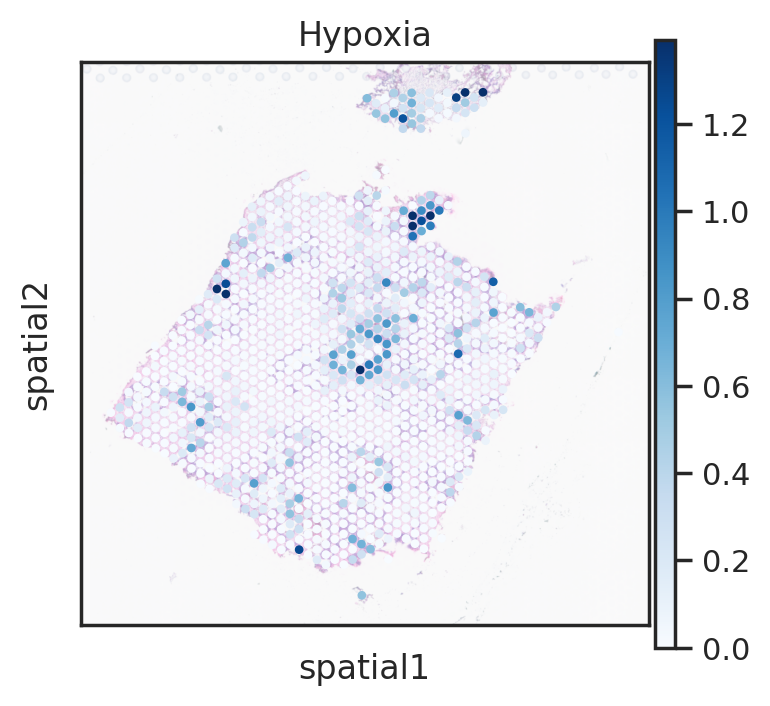

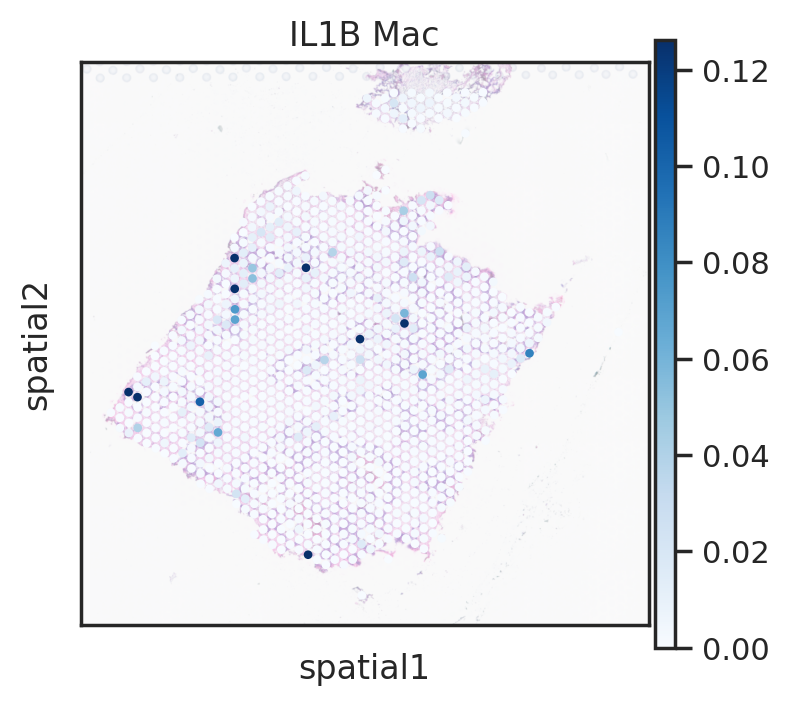

...

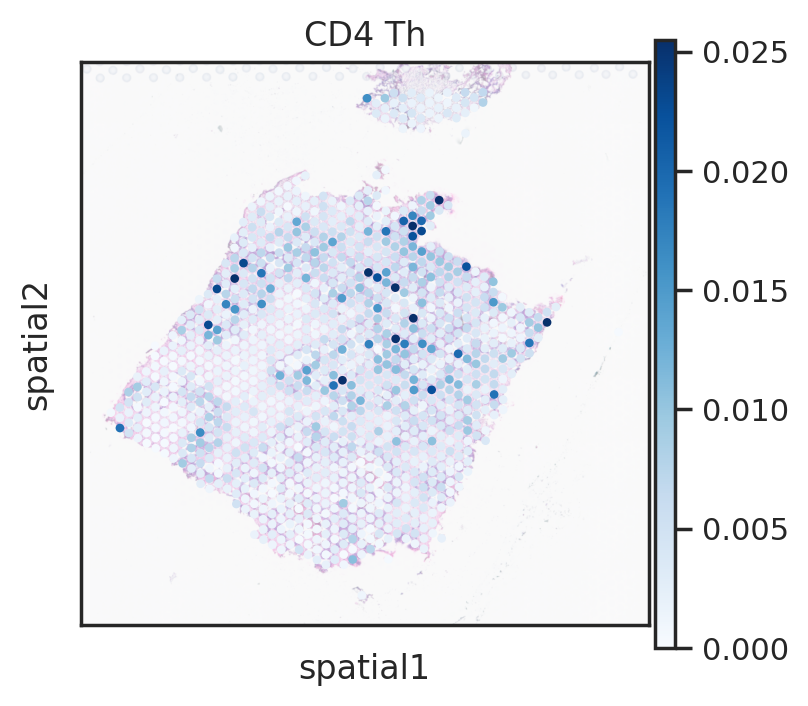

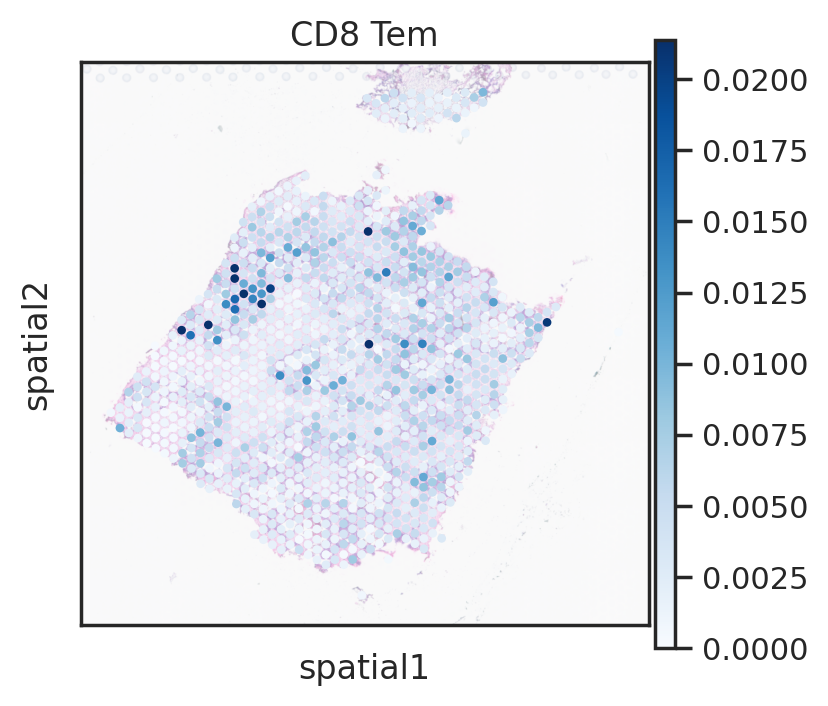

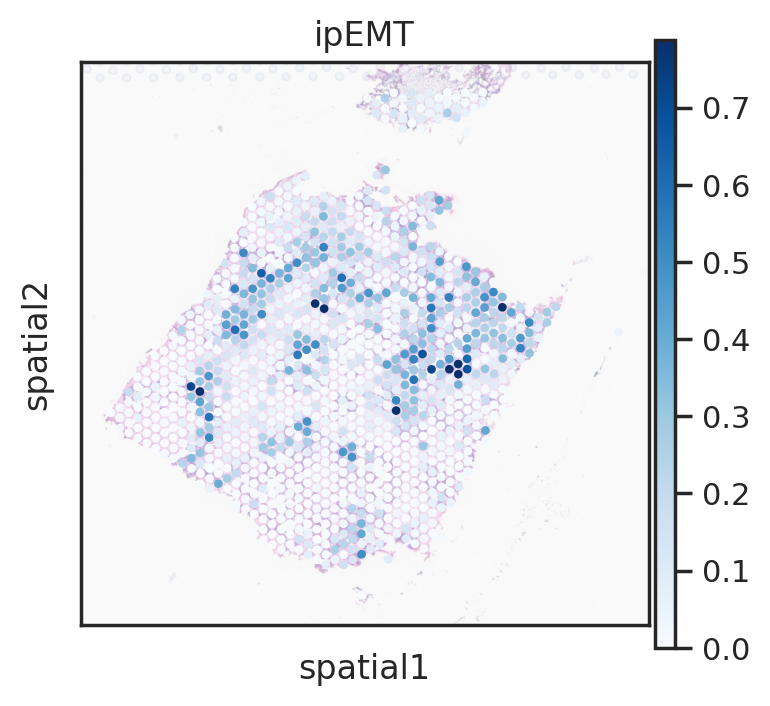

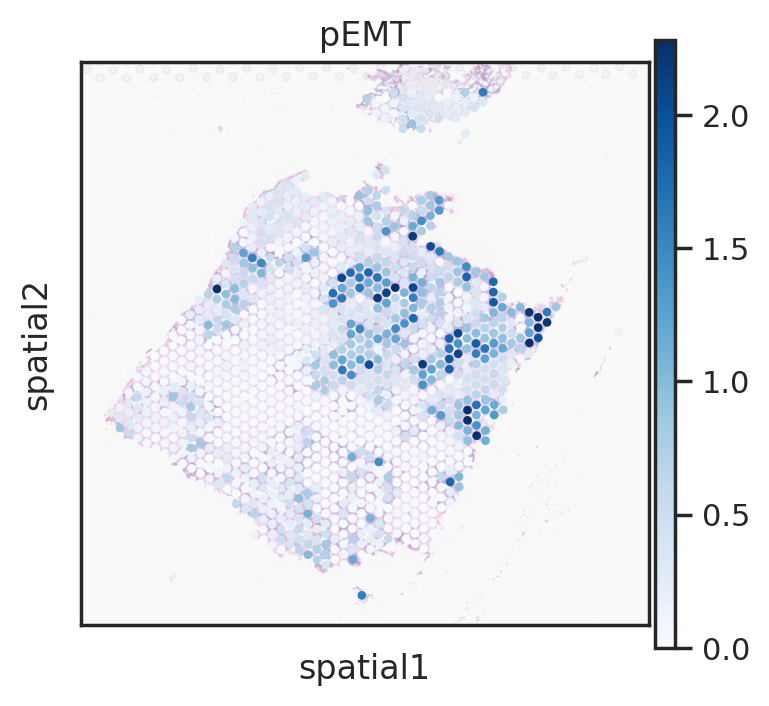

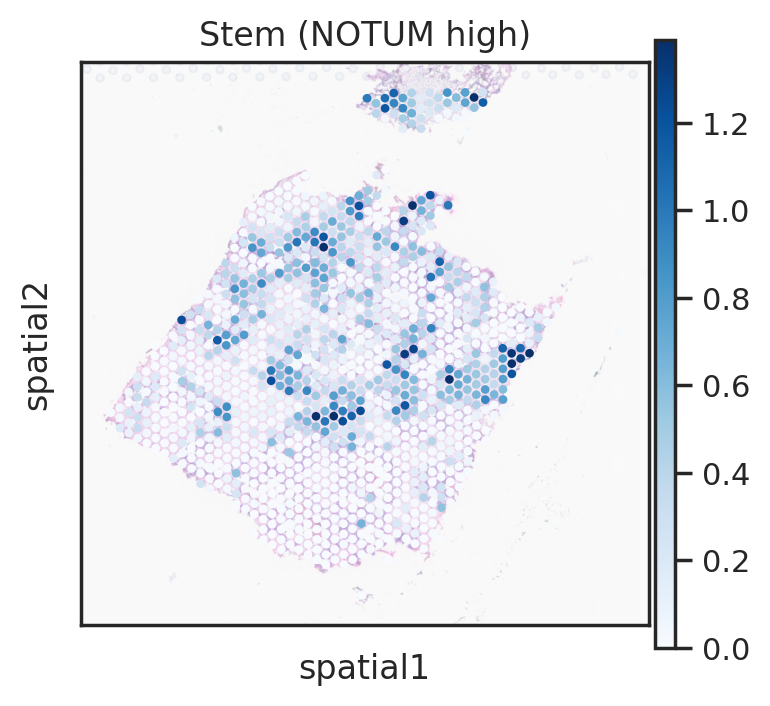

In [10]:
for cell2plot in ['C3 iCAF', 'CD8 Tex', 'ECM CAF', 'Hypoxia', 'IL1B Mac', 
                 'Lymphatic endo', 'Myofibroblast', 'NLRP3 Mac', 'Neutrophil',
                 'Pericyte', 'SMC', 'SPP1 Mac', 'Stalk-like endo', 'Kupffer', 'SEC', 'Hepatocyte',
                  'Tip-like endo', 'Treg', 'migDC',
                  'Colonocyte', 'Plasma', 'pDC', 'cDC1', 'cDC2', 'C1QC Mac', 'PLTP LYVE1 Mac', 'Goblet',
                  'CD4 Th', 'CD8 Tem', 'ipEMT', 'pEMT', 'Stem (NOTUM high)'
,                 ]:
    for visium_slide in set(adata_vis.obs["Sample"]):
        print(visium_slide)

        # select one slide
        slide = utils.select_slide(adata_vis, s=visium_slide, batch_key="Sample")

        # get size pixel
        lib_id = [x for x in slide.uns['spatial'].keys()][0]
        pix_size = spatial_plots.get_pixel_size_visium(slide, lib_id)

        # visualise cell locations
        # plot in spatial coordinates
        fig, ax = plt.subplots()
        with mpl.rc_context({"axes.facecolor": "black", "figure.figsize": [4.5, 5]}):

            sc.pl.spatial(
                slide,
                cmap="Blues", #plasma RdPu PuBu
                color=cell2plot,
                ncols=4,
                size=1.3,
                img_key="hires",
                alpha_img=0.5,
                # limit color scale at 99.2% quantile of cell abundance
                vmin=0,
                vmax="p99.4", # p99.7
                #save=f"{visium_slide}_{cell2plot}_4HE.pdf",
                show=False,
                ax=ax
            )
        # add scale bar
        #scalebar = ScaleBar(pix_size, "um", length_fraction=0.25, frameon=False, location='lower right')
        #ax.add_artist(scalebar)

        fig.savefig(
                FIG2SAVE.joinpath(f"{visium_slide}_{cell2plot}.pdf"),
                dpi=DPI,
                format="pdf",
                facecolor="w",
                transparent=True,
                edgecolor="w",
                bbox_inches="tight"
            )  

CRC09_LM_VISIUM


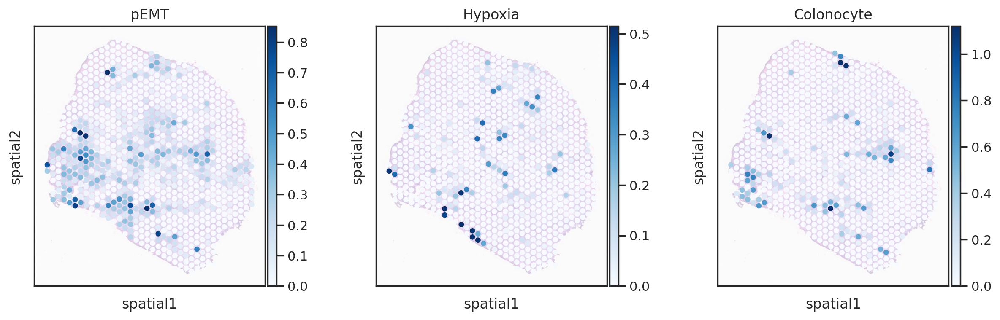

In [9]:
for visium_slide in set(adata_vis.obs["Sample"]):
    print(visium_slide)

    # select one slide
    slide = utils.select_slide(adata_vis, s=visium_slide, batch_key="Sample")
        
    sc.pl.spatial(slide,cmap='Blues',color=["pEMT", "Hypoxia", "Colonocyte"
                                           ], 
                  wspace=0.2,ncols=5,
                  size=1.3, img_key='hires',
                  alpha_img=0.3, vmin=0, vmax='p99.7',
                  title=["pEMT", "Hypoxia", "Colonocyte"],
                  save=f"{visium_slide}_pEMT_hypoxia_colonocyte.pdf"
                     )

CRC09_LM_VISIUM


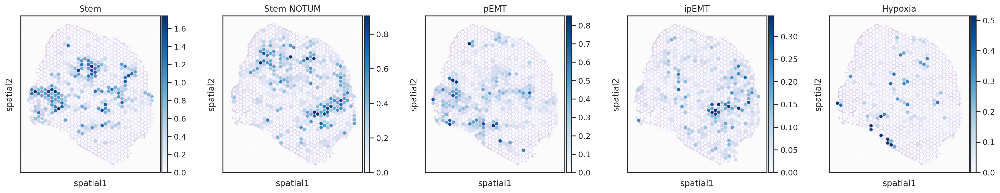

In [10]:
for visium_slide in set(adata_vis.obs["Sample"]):
    print(visium_slide)

    # select one slide
    slide = utils.select_slide(adata_vis, s=visium_slide, batch_key="Sample")
        
    sc.pl.spatial(slide,cmap='Blues',color=["Stem", "Stem (NOTUM high)", "pEMT", "ipEMT", "Hypoxia"
                                           ], 
                  wspace=0.2,ncols=5,
                  size=1.3, img_key='hires',
                  alpha_img=0.3, vmin=0, vmax='p99.7',
                  title=["Stem", "Stem NOTUM", "pEMT", "ipEMT", "Hypoxia"],
                  save=f"{visium_slide}_stem_pEMT_ipEMT.pdf"
                     )

### get HE and scale bar

In [11]:
# assign alpha image for samples 
set(adata_vis.obs["Sample"])
alpha_name_dict = {
    'CRC08_LM_VISIUM': (1, "CRC08"),
    'CRC09_LM_VISIUM': (1, "CRC09"),
    'CRC11_LM_VISIUM': (1, "CRC11"),
    'P13_Liver_ST': (0.7, "P13"),
    'P3_liver': (0.7, "P3"),
    'ST_LM_4': (0.7, "LM4"),
    
}

CRC09_LM_VISIUM


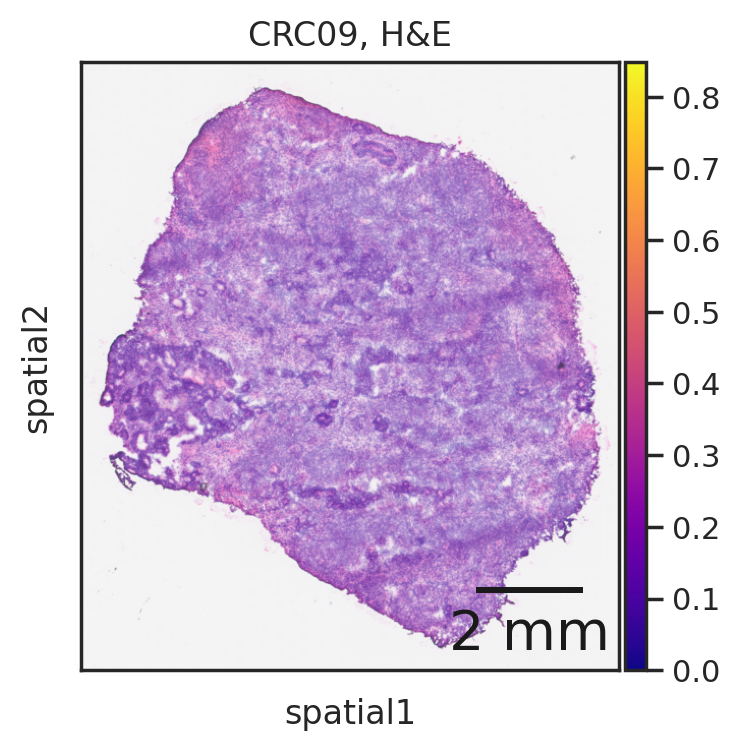

In [12]:
for visium_slide in set(adata_vis.obs["Sample"]):
    print(visium_slide)

    # select one slide
    slide = utils.select_slide(adata_vis, s=visium_slide, batch_key="Sample")
    
    # get size pixel
    lib_id = [x for x in slide.uns['spatial'].keys()][0]
    pix_size = spatial_plots.get_pixel_size_visium(slide, lib_id)

    # visualise cell locations
    # plot in spatial coordinates
    fig, ax = plt.subplots()
    with mpl.rc_context({"axes.facecolor": "black", "figure.figsize": [4.5, 5]}):

        sc.pl.spatial(
            slide,
            cmap="plasma",
            color=cell2plot,
            ncols=4,
            size=0,
            img_key="hires",
            alpha_img=alpha_name_dict[visium_slide][0],
            # limit color scale at 99.2% quantile of cell abundance
            vmin=0,
            vmax="p99.4",
            #save=f"{visium_slide}_{cell2plot}_4HE.pdf",
            title=f"{alpha_name_dict[visium_slide][1]}, H&E",
            show=False,
            ax=ax
        )
    # add scale bar
    scalebar = ScaleBar(pix_size, "um", length_fraction=0.25, frameon=False, location='lower right')
    ax.add_artist(scalebar)
    
    fig.savefig(
            FIG2SAVE.joinpath(f"{visium_slide}_HE.pdf"),
            dpi=DPI,
            format="pdf",
            facecolor="w",
            transparent=True,
            edgecolor="w",
            bbox_inches="tight"
        )  

In [13]:
FIG2SAVE

PosixPath('/data/BCI-CRC/nasrine/data/CRC/spatial/CRC_LM_VISIUM/CRC_LM_VISIUM_04_08_09_11/cell2location/CRC09_LM_VISIUM/cell2location_map-no_cycling_TME/figures/final')